In [31]:
#necessary imports
import pandas as pd
import geopandas as gpd
import numpy as np
from pyproj import Proj, transform
import rasterio
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import random

In [32]:
#load final dataset 
final = pd.read_csv('final_dataset.csv') 

In [33]:
final.head()

,img_path,xmin,ymin,xmax,ymax,score,img_name,tile_index,tile_xmin,tile_ymin,...,is_musacea_g,site,X_g,Y_g,updated diameter,group,updated height,AGB,carbon,id
0,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3332.557861,19.092411,3661.390137,364.616425,0.531211,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5298.555843,7709.844671,10.281385,banana,0.0,4.293300,1.674387,30
1,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3162.579834,2148.233398,3431.632324,2379.467041,0.511510,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5315.345160,8606.745732,13.528139,banana,0.0,7.702971,3.004159,112
2,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2893.605713,244.011108,3095.620605,451.257812,0.251310,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5228.142461,7935.770200,12.732366,banana,0.0,6.769828,2.640233,179
3,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2595.111084,1703.712402,2765.227295,1865.253418,0.217742,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,4434.058601,8354.081799,9.867583,banana,0.0,3.933601,1.534104,93
4,Carlos Vera Guevara RGB_10_7600_7600_11600_116...,249.691879,123.626862,439.557648,302.768402,0.282849,Carlos Vera Guevara RGB,10,7600,7600,...,1.0,Carlos Vera Guevara RGB,8257.952942,7554.538338,17.825312,banana,0.0,13.862143,5.406236,162


In [34]:
#seeing how many I would lose if I only use the ones with diameters 
final[final['diameter'] > 0].shape[0]/final.shape[0]

0.562084494960326

56% of the data is not great, but I also think it is important to have accurate DBH for what I am doing. 

In [35]:
final_sm = final[final['diameter'] > 0]

In [36]:
final_sm

,img_path,xmin,ymin,xmax,ymax,score,img_name,tile_index,tile_xmin,tile_ymin,...,is_musacea_g,site,X_g,Y_g,updated diameter,group,updated height,AGB,carbon,id
0,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3332.557861,19.092411,3661.390137,364.616425,0.531211,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5298.555843,7709.844671,10.281385,banana,0.0,4.293300,1.674387,30
1,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3162.579834,2148.233398,3431.632324,2379.467041,0.511510,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5315.345160,8606.745732,13.528139,banana,0.0,7.702971,3.004159,112
2,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2893.605713,244.011108,3095.620605,451.257812,0.251310,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5228.142461,7935.770200,12.732366,banana,0.0,6.769828,2.640233,179
3,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2595.111084,1703.712402,2765.227295,1865.253418,0.217742,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,4434.058601,8354.081799,9.867583,banana,0.0,3.933601,1.534104,93
4,Carlos Vera Guevara RGB_10_7600_7600_11600_116...,249.691879,123.626862,439.557648,302.768402,0.282849,Carlos Vera Guevara RGB,10,7600,7600,...,1.0,Carlos Vera Guevara RGB,8257.952942,7554.538338,17.825312,banana,0.0,13.862143,5.406236,162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4645,Nestor Macias RGB_3_0_9024_4000_13024.png,2664.345215,232.421860,2992.793945,577.599243,0.401987,Nestor Macias RGB,3,0,9024,...,0.0,Nestor Macias RGB,5083.016310,8395.427219,8.404929,other,0.0,16.643291,6.490884,167
4650,Nestor Macias RGB_3_0_9024_4000_13024.png,3003.697266,15.084885,3288.265381,276.357574,0.356021,Nestor Macias RGB,3,0,9024,...,0.0,Nestor Macias RGB,5232.131207,8130.712274,8.785332,fruit,0.0,24.072524,9.388284,108
4652,Nestor Macias RGB_3_0_9024_4000_13024.png,2624.353027,7.873686,2908.305420,132.604980,0.240188,Nestor Macias RGB,3,0,9024,...,0.0,Nestor Macias RGB,5162.918189,8152.987700,8.359419,cacao,2.2,8.090504,3.155296,162
4657,Nestor Macias RGB_10_7600_7600_11600_11600.png,1168.633789,1419.221558,1340.020508,1599.804932,0.455914,Nestor Macias RGB,10,7600,7600,...,0.0,Nestor Macias RGB,9463.438380,8020.578424,5.220658,cacao,1.5,3.185392,1.242303,500


## Comparing differences between field_data and field_data_sm

In [37]:
species_rep_before = final['name'].value_counts()

In [38]:
species_rep_after = final_sm['name'].value_counts()

In [39]:
#combining the two dataframes into a single one

compare_df = pd.DataFrame({'species_rep_before': species_rep_before, 'species_rep_after': species_rep_after}).fillna(0)
#add a column with the percentage of species lost
compare_df['percentage_lost'] = (compare_df['species_rep_before'] - compare_df['species_rep_after'])/compare_df['species_rep_before']
#refactor percentage_lost to be a percentage and round to 2 decimal places
compare_df['percentage_lost'] = round(compare_df['percentage_lost']*100, 2)

#make species_rep_after an integer
compare_df['species_rep_after'] = compare_df['species_rep_after'].astype(int)

#sort the table by highest species after 
compare_df = compare_df.sort_values(by='species_rep_after', ascending=False)

In [40]:
compare_df

,species_rep_before,species_rep_after,percentage_lost
name,,,
Musacea,1504,1480,1.60
Guaba,597,527,11.73
Cacao,2042,236,88.44
Mango,89,83,6.74
Otra variedad,86,81,5.81
Variedad bifurcada,72,72,0.00
Roble,27,25,7.41
Fernan Sanchez,24,16,33.33
Melina,18,16,11.11


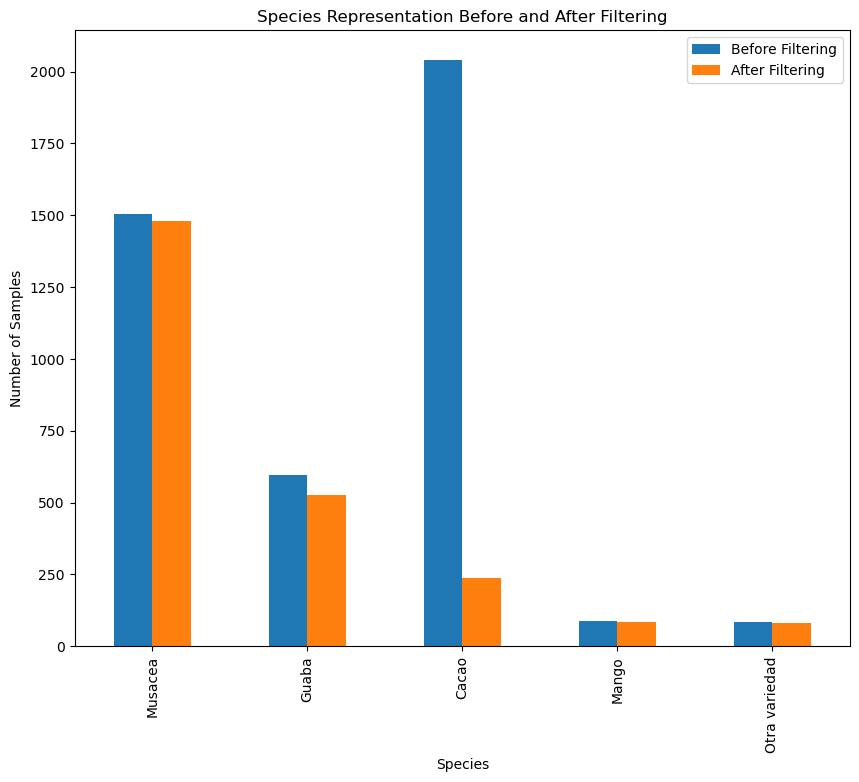

In [41]:
# Plotting the species representation before and after filtering

#only do the top 5 species
compare_df_plot = compare_df.head(5)
compare_df_plot[['species_rep_before', 'species_rep_after']].plot(kind='bar', figsize=(10, 8))
plt.title('Species Representation Before and After Filtering')
plt.xlabel('Species')
plt.ylabel('Number of Samples')
plt.xticks(rotation=90)
plt.legend(['Before Filtering', 'After Filtering'])
plt.show()


With this culling, we have lost three of the species entirely and we have lost 88% of the Cacao data. 

## Visualizing some of the bounding boxes 

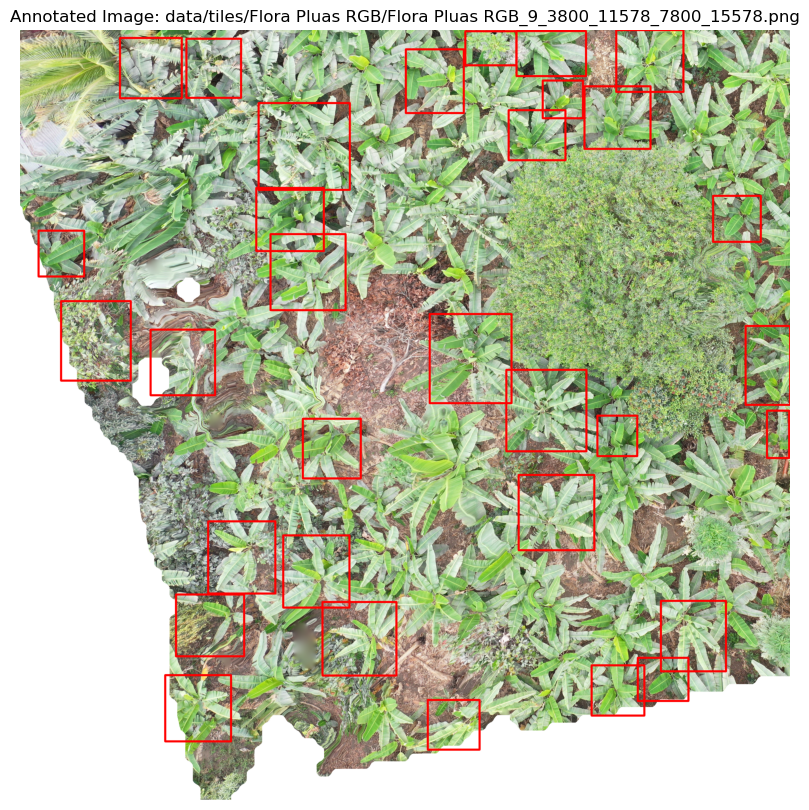

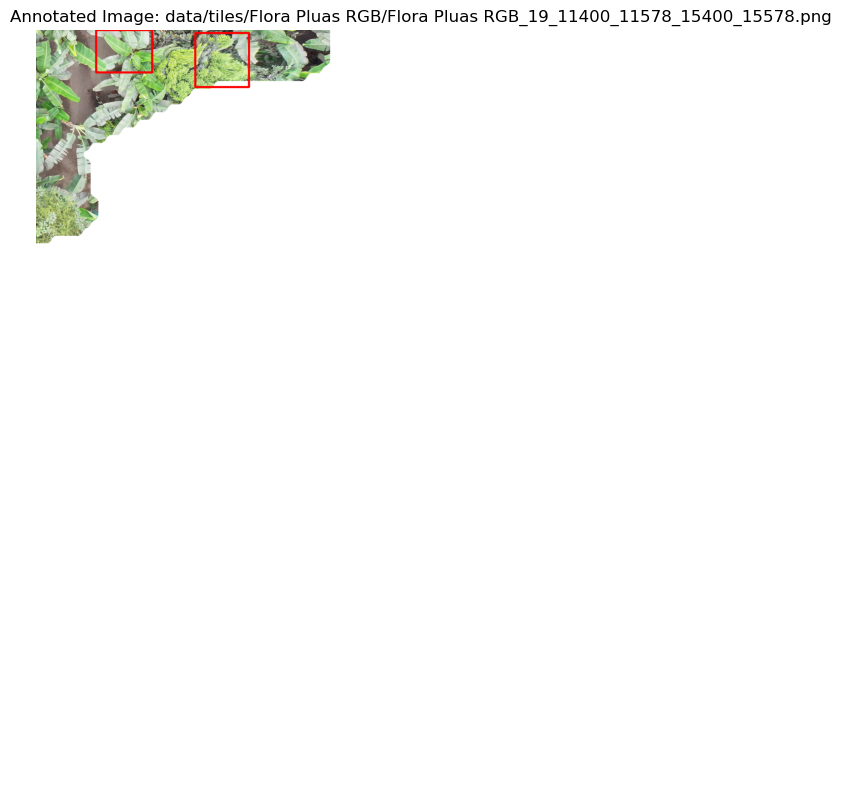

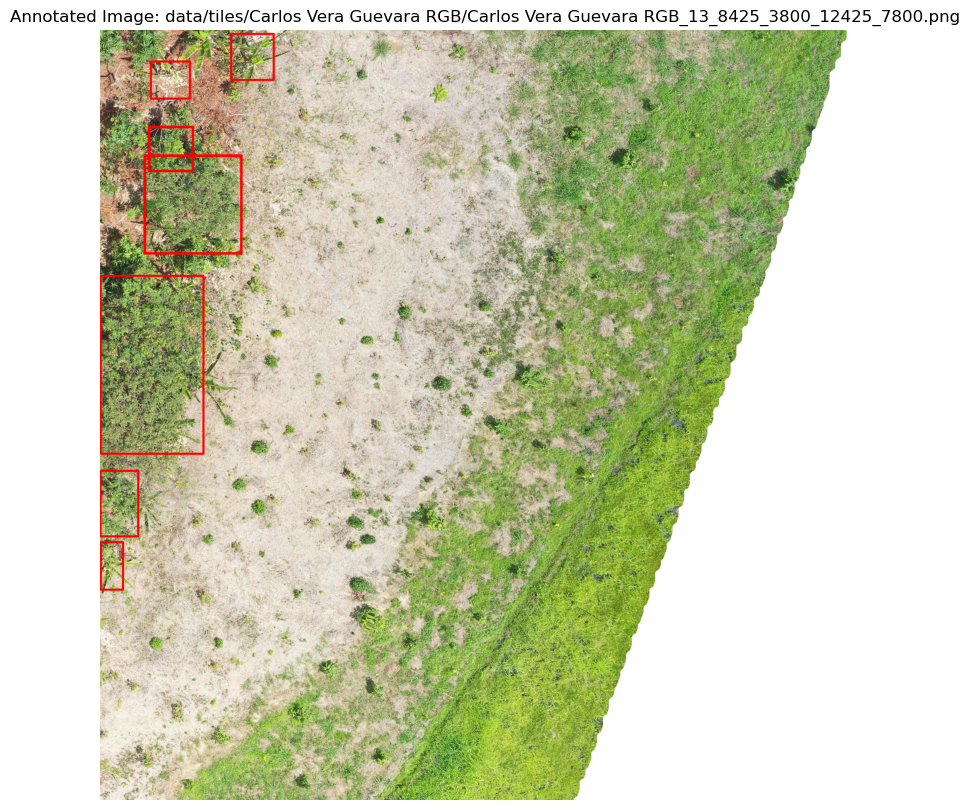

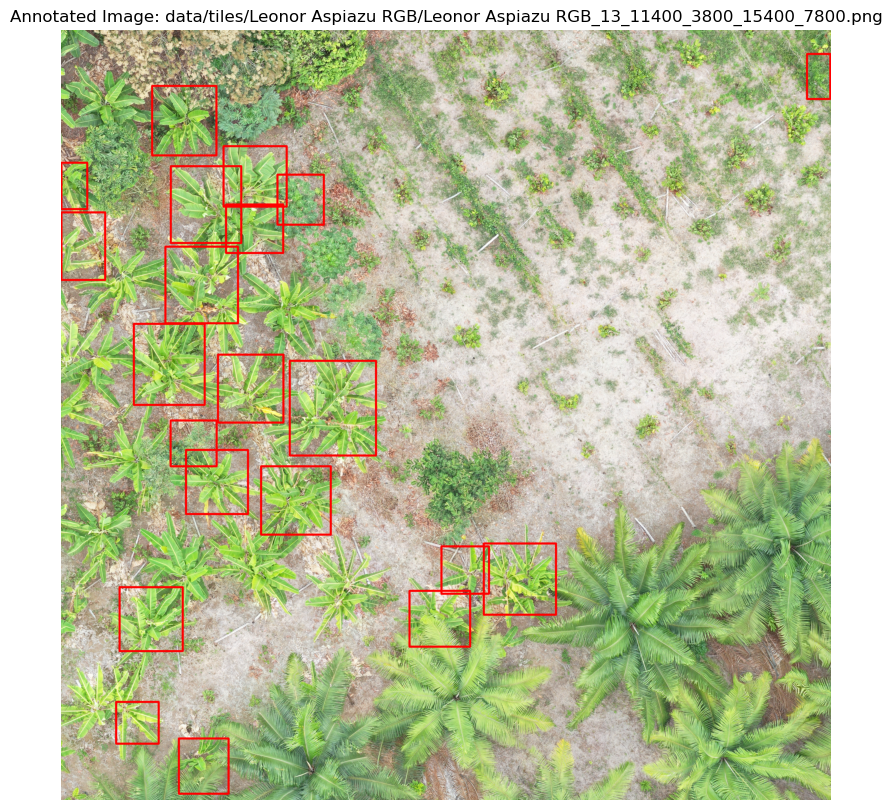

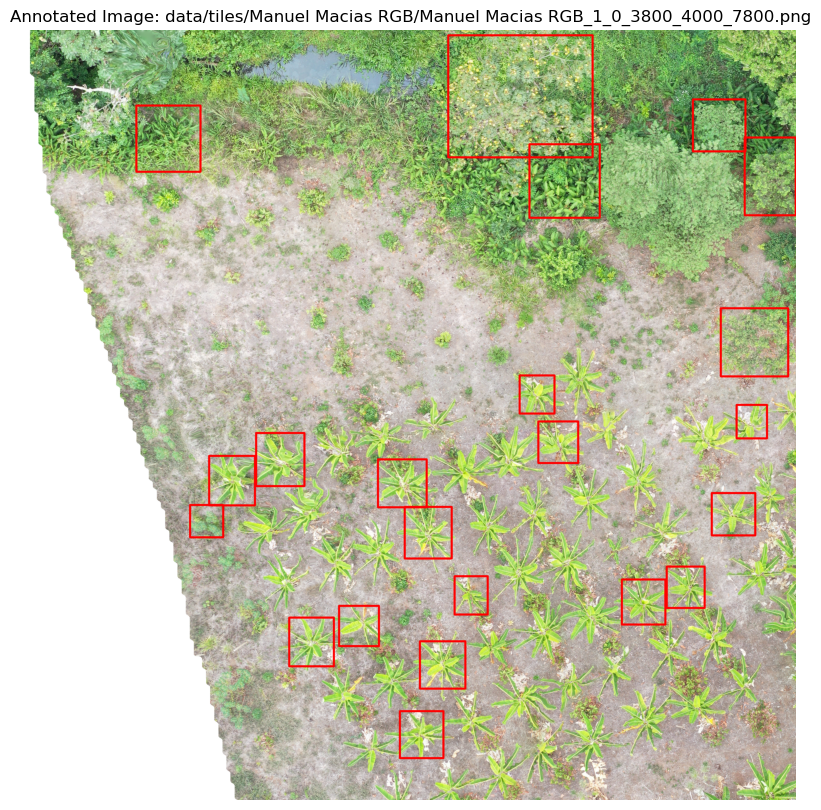

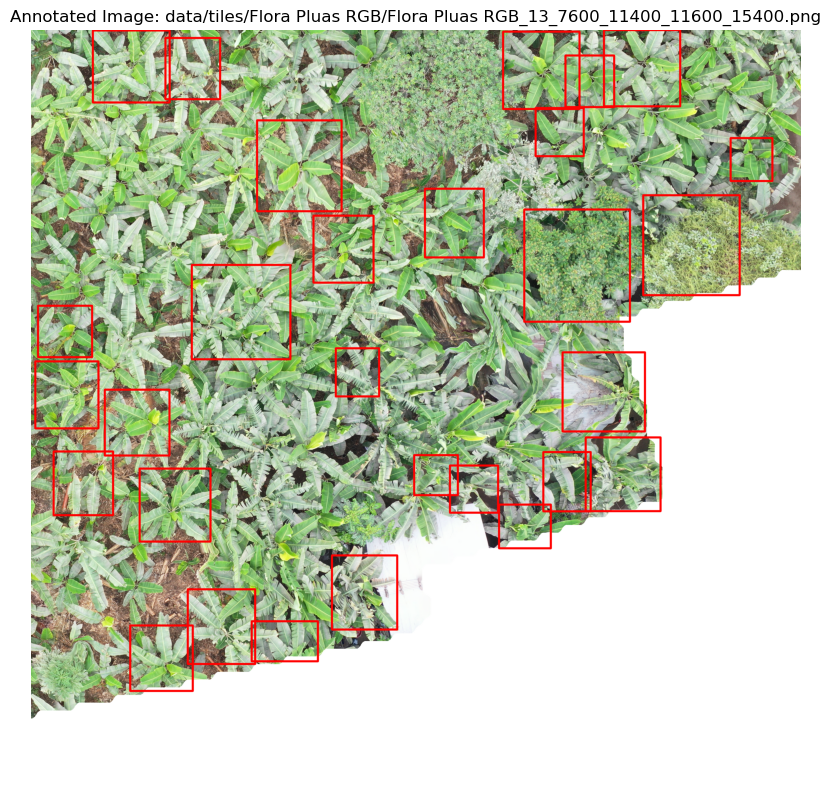

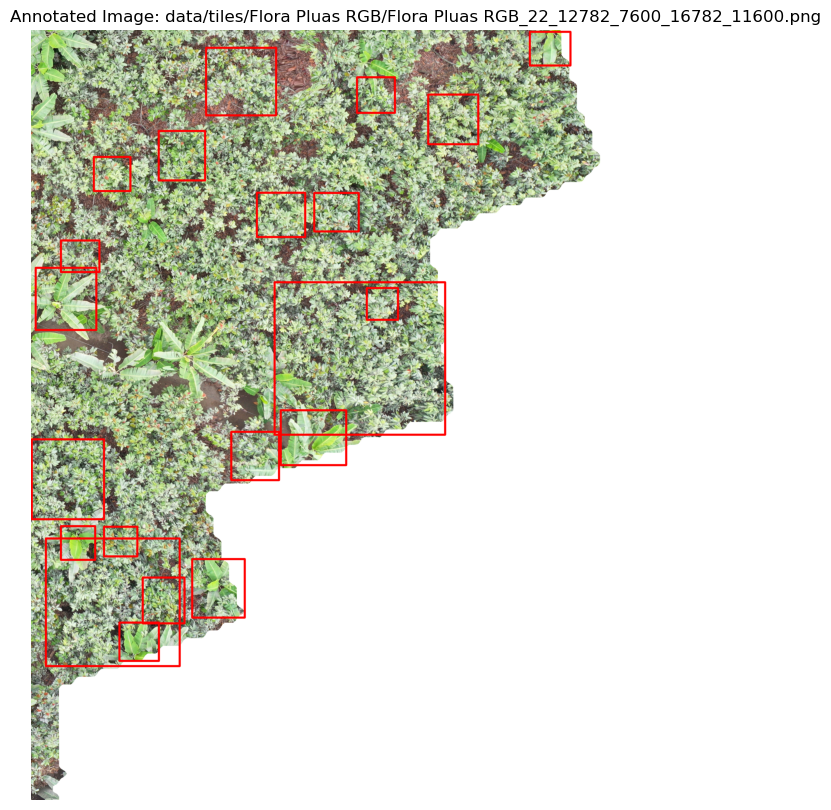

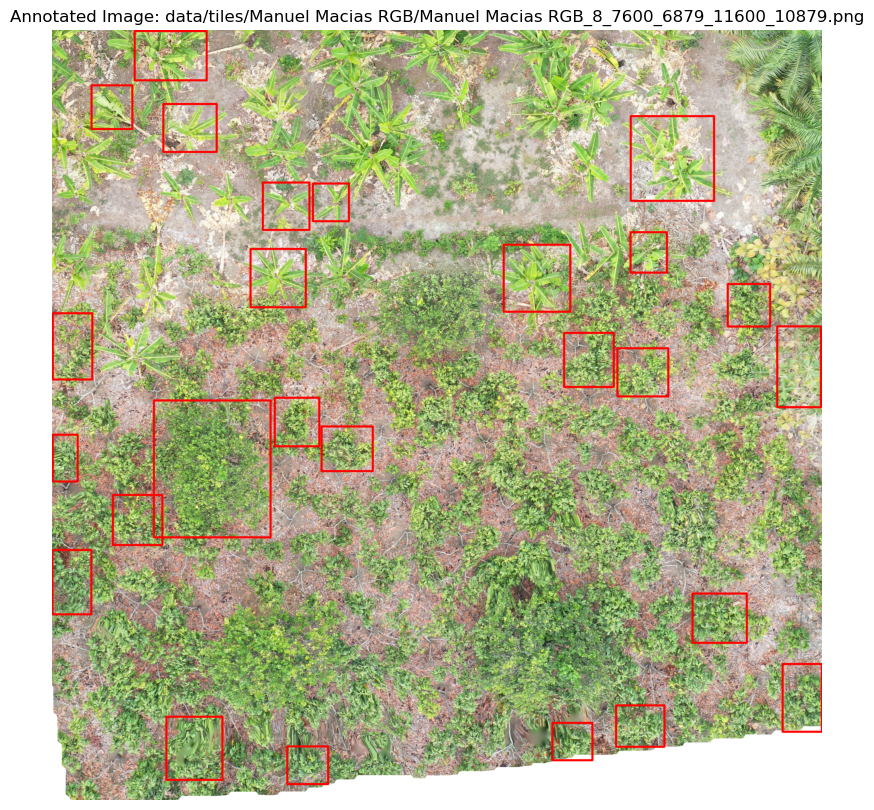

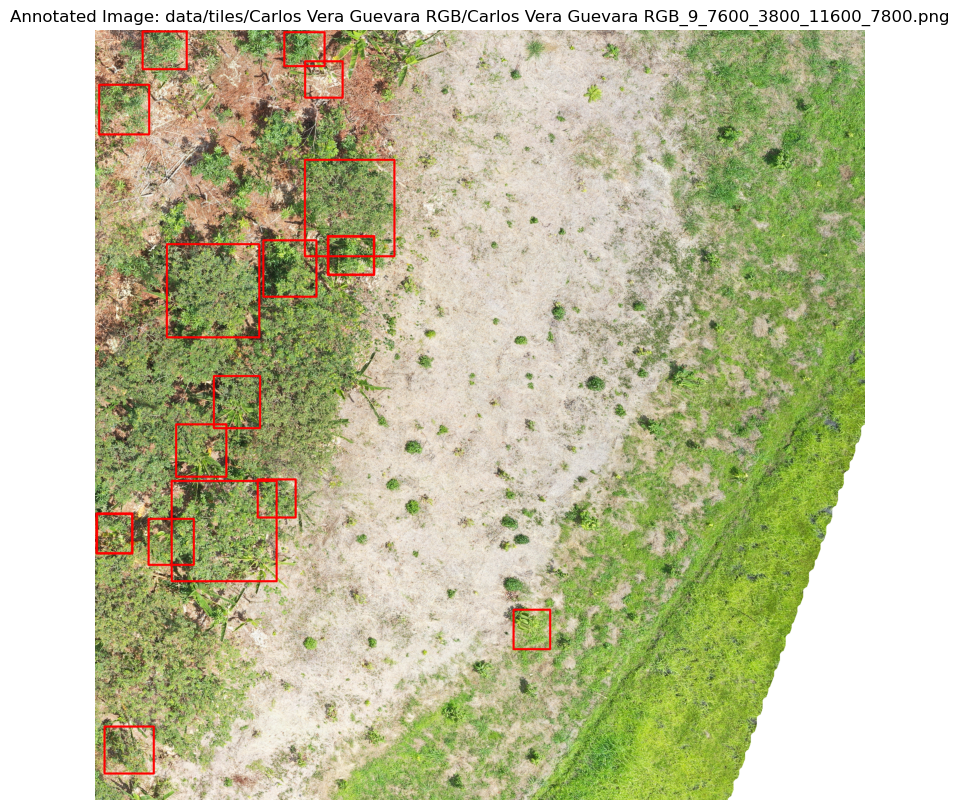

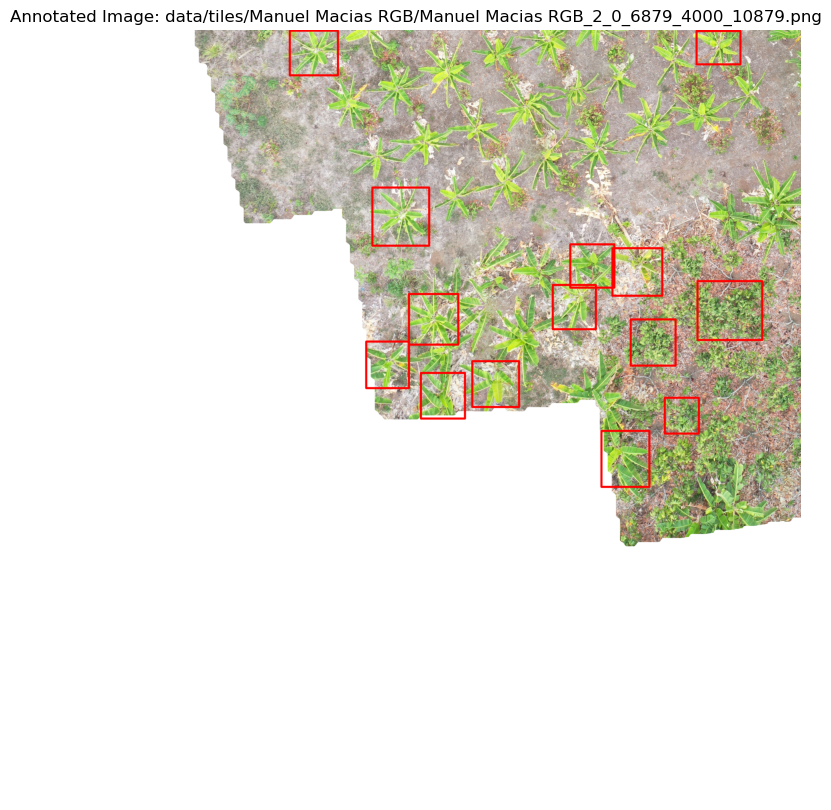

In [42]:
def draw_bounding_boxes(image_path, bounding_boxes):
    # Load the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Image at {image_path} could not be loaded.")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Draw each bounding box
    for bbox in bounding_boxes:
        xmin, ymin, xmax, ymax = bbox['xmin'], bbox['ymin'], bbox['xmax'], bbox['ymax']
        cv2.rectangle(image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (255, 0, 0), 10)
    
    return image

# Group the data by image
grouped = final_sm.groupby('img_path')

# Randomly sample 10 groups
sampled_groups = random.sample(list(grouped), 10)

# Iterate over each sampled group (each image) and draw bounding boxes
for img_path, group in sampled_groups:
    # Construct the full image path
    img_path = 'data/tiles/' + group.iloc[0]['img_name'] + '/' + img_path
    
    bounding_boxes = group[['xmin', 'ymin', 'xmax', 'ymax']].to_dict('records')
    annotated_image = draw_bounding_boxes(img_path, bounding_boxes)
    
    if annotated_image is not None:
        # Display the image with bounding boxes
        plt.figure(figsize=(10, 10))
        plt.imshow(annotated_image)
        plt.title(f"Annotated Image: {img_path}")
        plt.axis('off')
        plt.show()

## Using Basic DeepForest Model

In [2]:
from deepforest import main
from deepforest import get_data

In [3]:
model = main.deepforest()
model.use_release()

Reading config file: /opt/homebrew/Caskroom/miniconda/base/envs/IRP_2/lib/python3.9/site-packages/deepforest/data/deepforest_config.yml


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


No validation file provided. Turning off validation loop


NEON.pt: 129MB [00:23, 5.53MB/s]                              


Model was downloaded and saved to /opt/homebrew/Caskroom/miniconda/base/envs/IRP_2/lib/python3.9/site-packages/deepforest/data/NEON.pt
Loading pre-built model: https://github.com/weecology/DeepForest/releases/tag/1.0.0


In [43]:
sample_image_path = "data/tiles/Manuel Macias RGB/Manuel Macias RGB_2_0_6879_4000_10879.png"

In [44]:
boxes = model.predict_image(path=sample_image_path, return_plot = True, color=(0, 0, 255), thickness=10)

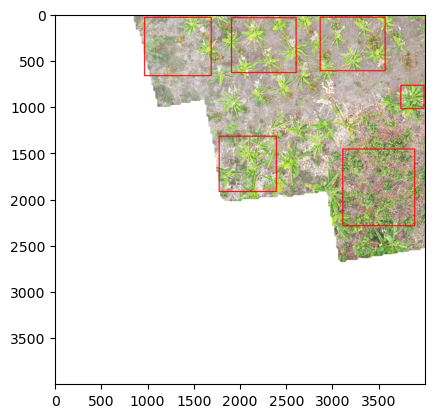

In [45]:
import matplotlib.pyplot as plt
plt.imshow(boxes[:,:,::-1])

In [46]:
final_sm

,img_path,xmin,ymin,xmax,ymax,score,img_name,tile_index,tile_xmin,tile_ymin,...,is_musacea_g,site,X_g,Y_g,updated diameter,group,updated height,AGB,carbon,id
0,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3332.557861,19.092411,3661.390137,364.616425,0.531211,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5298.555843,7709.844671,10.281385,banana,0.0,4.293300,1.674387,30
1,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3162.579834,2148.233398,3431.632324,2379.467041,0.511510,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5315.345160,8606.745732,13.528139,banana,0.0,7.702971,3.004159,112
2,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2893.605713,244.011108,3095.620605,451.257812,0.251310,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,5228.142461,7935.770200,12.732366,banana,0.0,6.769828,2.640233,179
3,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2595.111084,1703.712402,2765.227295,1865.253418,0.217742,Carlos Vera Guevara RGB,3,0,8305,...,1.0,Carlos Vera Guevara RGB,4434.058601,8354.081799,9.867583,banana,0.0,3.933601,1.534104,93
4,Carlos Vera Guevara RGB_10_7600_7600_11600_116...,249.691879,123.626862,439.557648,302.768402,0.282849,Carlos Vera Guevara RGB,10,7600,7600,...,1.0,Carlos Vera Guevara RGB,8257.952942,7554.538338,17.825312,banana,0.0,13.862143,5.406236,162
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4645,Nestor Macias RGB_3_0_9024_4000_13024.png,2664.345215,232.421860,2992.793945,577.599243,0.401987,Nestor Macias RGB,3,0,9024,...,0.0,Nestor Macias RGB,5083.016310,8395.427219,8.404929,other,0.0,16.643291,6.490884,167
4650,Nestor Macias RGB_3_0_9024_4000_13024.png,3003.697266,15.084885,3288.265381,276.357574,0.356021,Nestor Macias RGB,3,0,9024,...,0.0,Nestor Macias RGB,5232.131207,8130.712274,8.785332,fruit,0.0,24.072524,9.388284,108
4652,Nestor Macias RGB_3_0_9024_4000_13024.png,2624.353027,7.873686,2908.305420,132.604980,0.240188,Nestor Macias RGB,3,0,9024,...,0.0,Nestor Macias RGB,5162.918189,8152.987700,8.359419,cacao,2.2,8.090504,3.155296,162
4657,Nestor Macias RGB_10_7600_7600_11600_11600.png,1168.633789,1419.221558,1340.020508,1599.804932,0.455914,Nestor Macias RGB,10,7600,7600,...,0.0,Nestor Macias RGB,9463.438380,8020.578424,5.220658,cacao,1.5,3.185392,1.242303,500


### Making my dataset in the format deepforest expects

In [146]:
deepforest_data = final_sm[['img_path', 'xmin', 'ymin', 'xmax', 'ymax']]
deepforest_data['label'] = 'Tree'

/var/folders/ym/hz9zm7z56_z32pf0g7q1mxdw0000gp/T/ipykernel_32877/990656736.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deepforest_data['label'] = 'Tree'


In [147]:
deepforest_data['xmin'] = deepforest_data['xmin'].astype('float32') 
deepforest_data['ymin'] = deepforest_data['ymin'].astype('float32')
deepforest_data['xmax'] = deepforest_data['xmax'].astype('float32')
deepforest_data['ymax'] = deepforest_data['ymax'].astype('float32')

/var/folders/ym/hz9zm7z56_z32pf0g7q1mxdw0000gp/T/ipykernel_32877/1377754422.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deepforest_data['xmin'] = deepforest_data['xmin'].astype('float32')
/var/folders/ym/hz9zm7z56_z32pf0g7q1mxdw0000gp/T/ipykernel_32877/1377754422.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  deepforest_data['ymin'] = deepforest_data['ymin'].astype('float32')
/var/folders/ym/hz9zm7z56_z32pf0g7q1mxdw0000gp/T/ipykernel_32877/1377754422.py:3: SettingWithCopyWarning: 
A value is tr

In [148]:
#rename img_path to image_path
deepforest_data = deepforest_data.rename(columns={'img_path': 'image_path'})

In [149]:
deepforest_data

,image_path,xmin,ymin,xmax,ymax,label
0,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3332.557861,19.092411,3661.390137,364.616425,Tree
1,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,3162.579834,2148.233398,3431.632324,2379.467041,Tree
2,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2893.605713,244.011108,3095.620605,451.257812,Tree
3,Carlos Vera Guevara RGB_3_0_8305_4000_12305.png,2595.111084,1703.712402,2765.227295,1865.253418,Tree
4,Carlos Vera Guevara RGB_10_7600_7600_11600_116...,249.691879,123.626862,439.557648,302.768402,Tree
...,...,...,...,...,...,...
4645,Nestor Macias RGB_3_0_9024_4000_13024.png,2664.345215,232.421860,2992.793945,577.599243,Tree
4650,Nestor Macias RGB_3_0_9024_4000_13024.png,3003.697266,15.084885,3288.265381,276.357574,Tree
4652,Nestor Macias RGB_3_0_9024_4000_13024.png,2624.353027,7.873686,2908.305420,132.604980,Tree
4657,Nestor Macias RGB_10_7600_7600_11600_11600.png,1168.633789,1419.221558,1340.020508,1599.804932,Tree


In [150]:
#splitting into training and test sets 
from sklearn.model_selection import train_test_split

train_data, temp_data = train_test_split(deepforest_data, test_size=0.3, random_state=42)
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

In [151]:
train_data.to_csv('data/deepforest_train_dataset.csv', index=False)
val_data.to_csv('data/deepforest_val_dataset.csv', index=False)
test_data.to_csv('data/deepforest_test_dataset.csv', index=False)

In [152]:
from torch.utils.data import Dataset, DataLoader
class CustomDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        image_path = row['image_path']
        xmin = torch.tensor(row['xmin'], dtype=torch.float32)
        ymin = torch.tensor(row['ymin'], dtype=torch.float32)
        xmax = torch.tensor(row['xmax'], dtype=torch.float32)
        ymax = torch.tensor(row['ymax'], dtype=torch.float32)
        label = row['label'] 
        return image_path, xmin, ymin, xmax, ymax, label

In [153]:
# Initialize the Datasets
train_dataset = CustomDataset(train_data)
val_dataset = CustomDataset(val_data)
test_dataset = CustomDataset(test_data)

# Initialize DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [154]:
model = main.deepforest()
model.use_release()

Reading config file: /opt/homebrew/Caskroom/miniconda/base/envs/IRP_2/lib/python3.9/site-packages/deepforest/data/deepforest_config.yml
No validation file provided. Turning off validation loop


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Model from DeepForest release https://github.com/weecology/DeepForest/releases/tag/1.0.0 was already downloaded. Loading model from file.
Loading pre-built model: https://github.com/weecology/DeepForest/releases/tag/1.0.0


In [155]:
model.config["epochs"] = 5
model.config["save-snapshot"] = True
model.config["train"]["csv_file"] = "data/deepforest_train_dataset.csv"
model.config["train"]["root_dir"] = "data/tiles"
model.config["validation"]["csv_file"] = "data/deepforest_val_dataset.csv"
model.config["validation"]["root_dir"] = "data/tiles"

model.create_trainer()

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


In [156]:
model.config["train"]["persistent_workers"] = True
model.config["validation"]["persistent_workers"] = True

In [157]:
import torch
model.model = model.model.to(torch.float32)

In [158]:
model.trainer.fit(model, train_loader, val_loader)

/opt/homebrew/Caskroom/miniconda/base/envs/IRP_2/lib/python3.9/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "

  | Name       | Type                  | Params | Mode 
-------------------------------------------------------------
0 | model      | RetinaNet             | 32.1 M | train
1 | iou_metric | IntersectionOverUnion | 0      | train
2 | mAP_metric | MeanAveragePrecision  | 0      | train
-------------------------------------------------------------
31.9 M    Trainable params
222 K     Non-trainable params
32.1 M    Total params
128.592   Total estimated model params size (MB)


Sanity Checking DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 375.93it/s] 

/opt/homebrew/Caskroom/miniconda/base/envs/IRP_2/lib/python3.9/site-packages/pytorch_lightning/trainer/connectors/data_connector.py:424: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=7` in the `DataLoader` to improve performance.
/opt/homebrew/Caskroom/miniconda/base/envs/IRP_2/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:43: UserWarning: The ``compute`` method of metric IntersectionOverUnion was called before the ``update`` method which may lead to errors, as metric states have not yet been updated.
  warnings.warn(*args, **kwargs)  # noqa: B028


RuntimeError: torch.cat(): expected a non-empty list of Tensors